In [98]:
# import os
# import requests
# from tqdm import tqdm
# from PIL import Image
# from io import BytesIO

In [ ]:

# # Set up Unsplash API access key
# unsplash_access_key = ""  # Replace with your Unsplash Access Key
# unsplash_search_url = "https://api.unsplash.com/search/photos"

# # Set parameters
# images_per_class = 100
# train_split = 80  #80% for training 
# classes = ["dolphin", "snake"]

# # Directory setup
# base_dir = "dataset"
# train_dir = os.path.join(base_dir, "train")
# test_dir = os.path.join(base_dir, "test")
# os.makedirs(train_dir, exist_ok=True)
# os.makedirs(test_dir, exist_ok=True)

# # Set up headers for authorization
# headers = {
#     "Authorization": f"Client-ID {unsplash_access_key}"
# }

# def fetch_images(search_query, num_images):
#     """Fetch image URLs from Unsplash, handling pagination."""
#     params = {
#         "query": search_query,
#         "per_page": 30,  # Max images per request
#         "orientation": "landscape"
#     }
#     links = []
#     page = 1

#     while len(links) < num_images:
#         params["page"] = page
#         response = requests.get(unsplash_search_url, headers=headers, params=params)
#         response.raise_for_status()
#         data = response.json()

#         # Collect image URLs
#         for result in data.get("results", []):
#             if len(links) < num_images:
#                 links.append(result["urls"]["regular"])
#             else:
#                 break
        
#         if not data.get("results"):
#             print(f"No more images found for '{search_query}' after {len(links)} images.")
#             break

#         page += 1  # Move to the next page

#     return links[:num_images]

# def download_and_save_images(image_urls, save_dir, class_name, start_index=0):
#     """Download and save images from a list of URLs."""
#     os.makedirs(save_dir, exist_ok=True)
#     for i, url in enumerate(tqdm(image_urls, desc=f"Downloading {class_name} images")):
#         try:
#             response = requests.get(url)
#             response.raise_for_status()
#             img = Image.open(BytesIO(response.content)).convert("RGB")  # Ensure RGB format
#             img_path = os.path.join(save_dir, f"{class_name}_{start_index + i + 1}.jpg")
#             img.save(img_path, "JPEG")
#         except Exception as e:
#             print(f"Error downloading {url}: {e}")

# def download_dataset():
#     for class_name in classes:
#         print(f"Fetching {images_per_class} images for '{class_name}' class...")
#         image_urls = fetch_images(class_name, images_per_class)
        
#         # Split into training and testing
#         train_urls = image_urls[:train_split]
#         test_urls = image_urls[train_split:]

#         # Download training images
#         print(f"Downloading training images for '{class_name}'...")
#         download_and_save_images(train_urls, os.path.join(train_dir, class_name), class_name)

#         # Download testing images
#         print(f"Downloading testing images for '{class_name}'...")
#         download_and_save_images(test_urls, os.path.join(test_dir, class_name), class_name)

# if __name__ == "__main__":
#     download_dataset()


In [100]:
import pandas as pd
import numpy as np
import sys
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
import time
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [101]:
models=["VGG(1 block)","VGG(3 blocks)","VGG(3 blocks) with augmentation","VGG16(MLP layers)","VGG16(all layers)"]

In [102]:
data={
    "Training Time":[0]*5,"Training Loss":[0]*5,"Training Accuracy":[0]*5,"Testing Accuracy":[0]*5,"Model parameters":[0]*5
}

In [103]:
# define cnn model VGG block 1
def define_model():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(200, 200, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [104]:
# define cnn model VGG block 3
def define_model_1():
	model = Sequential()
	model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(200, 200, 3)))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
	model.add(MaxPooling2D((2, 2)))
	model.add(Flatten())
	model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [106]:
def summarize_diagnostics(history, ind):
    # Plot loss
    plt.figure(figsize=(10, 5))
    plt.subplot(211)
    plt.title('Cross Entropy Loss')
    plt.plot(history['loss'], color='blue', label='train')
    plt.legend()

    # Plot accuracy
    plt.subplot(212)
    plt.title('Classification Accuracy')
    plt.plot(history['accuracy'], color='blue', label='train')
    plt.legend()

    # Save plot to file
    plt.tight_layout()
    filename = f"model{ind}.png"
    plt.savefig(filename)
    print(f"Plot saved as {filename}")
    plt.close()

# Run the test harness for evaluating a model
def run_test_harness(m, ind):
    # Define model
    model = m()
    # Create data generator
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    # Prepare iterators
    train_it = datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))

    # Custom loop to log training and testing metrics
    start_time = time.time()
    history = {"loss": [], "accuracy": []}  # Store training history manually

    for epoch in range(10):  # Replace with desired number of epochs
        print(f'Epoch {epoch + 1}/{10}')
        hist = model.fit(train_it, steps_per_epoch=len(train_it), epochs=1, verbose=1)
        history["loss"].extend(hist.history['loss'])
        history["accuracy"].extend(hist.history['accuracy'])
        
        # Log training metrics
        data["Training Accuracy"][ind] = np.mean(history["accuracy"]) * 100
        data["Training Loss"][ind] = np.mean(history["loss"])

        # Evaluate on test set and log test accuracy
        _, test_acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
        print(f'> Test Accuracy after epoch {epoch + 1}: {test_acc * 100.0:.3f}%')
        data["Testing Accuracy"][ind] = test_acc * 100

    end_time = time.time()
    data["Training Time"][ind] = end_time - start_time
    data["Model parameters"][ind] = model.count_params()
    
    # Learning curves
    summarize_diagnostics(history, ind)
    model.save(f"model_{ind + 1}.h5")

# Entry point, run the test harness
run_test_harness(define_model, 0)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
3/3 [==============================] - 5s 1s/step - loss: 39.7329 - accuracy: 0.5562
> Test Accuracy after epoch 1: 55.000%
Epoch 2/10
3/3 [==============================] - 4s 1s/step - loss: 26.7666 - accuracy: 0.7063
> Test Accuracy after epoch 2: 72.500%
Epoch 3/10
3/3 [==============================] - 4s 2s/step - loss: 18.4970 - accuracy: 0.8500
> Test Accuracy after epoch 3: 82.500%
Epoch 4/10
3/3 [==============================] - 4s 1s/step - loss: 3.7694 - accuracy: 0.9312
> Test Accuracy after epoch 4: 80.000%
Epoch 5/10
3/3 [==============================] - 4s 951ms/step - loss: 8.4040 - accuracy: 0.8438
> Test Accuracy after epoch 5: 92.500%
Epoch 6/10
3/3 [==============================] - 3s 972ms/step - loss: 2.1176 - accuracy: 0.9500
> Test Accuracy after epoch 6: 80.000%
Epoch 7/10
3/3 [==============================] - 3s 987ms/step - loss: 7.3317 - accuracy: 0.9000
> Test A

In [107]:
print(data)

{'Training Time': [56.803476333618164, 0, 0, 0, 0], 'Training Loss': [11.60408706665039, 0, 0, 0, 0], 'Training Accuracy': [85.31249940395355, 0, 0, 0, 0], 'Testing Accuracy': [94.9999988079071, 0, 0, 0, 0], 'Model parameters': [40961153, 0, 0, 0, 0]}


In [108]:
run_test_harness(define_model_1,1)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
3/3 [==============================] - 6s 2s/step - loss: 20.0347 - accuracy: 0.6125
> Test Accuracy after epoch 1: 50.000%
Epoch 2/10
3/3 [==============================] - 5s 1s/step - loss: 8.4294 - accuracy: 0.5063
> Test Accuracy after epoch 2: 85.000%
Epoch 3/10
3/3 [==============================] - 5s 1s/step - loss: 0.7893 - accuracy: 0.7437
> Test Accuracy after epoch 3: 67.500%
Epoch 4/10
3/3 [==============================] - 6s 2s/step - loss: 0.4057 - accuracy: 0.9000
> Test Accuracy after epoch 4: 90.000%
Epoch 5/10
3/3 [==============================] - 5s 2s/step - loss: 0.3184 - accuracy: 0.9062
> Test Accuracy after epoch 5: 90.000%
Epoch 6/10
3/3 [==============================] - 5s 1s/step - loss: 0.1828 - accuracy: 0.9187
> Test Accuracy after epoch 6: 80.000%
Epoch 7/10
3/3 [==============================] - 5s 1s/step - loss: 0.1468 - accuracy: 0.9375
> Test Accuracy aft

In [109]:
print(data)

{'Training Time': [56.803476333618164, 74.38446998596191, 0, 0, 0], 'Training Loss': [11.60408706665039, 3.0591397911310194, 0, 0, 0], 'Training Accuracy': [85.31249940395355, 84.31249976158142, 0, 0, 0], 'Testing Accuracy': [94.9999988079071, 85.00000238418579, 0, 0, 0], 'Model parameters': [40961153, 10333505, 0, 0, 0]}


In [110]:
def run_test_harness_aug(m, ind):
    # Define model
    model = m()
    # Create data generator with augmentation for training
    train_datagen = ImageDataGenerator(rescale=1.0/255.0, width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    # Prepare iterators
    train_it = train_datagen.flow_from_directory('dataset/train/', class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = test_datagen.flow_from_directory('dataset/test/', class_mode='binary', batch_size=64, target_size=(200, 200))

    # Custom loop to log training and testing metrics
    start_time = time.time()
    history = {"loss": [], "accuracy": []}  # Manually store training history

    for epoch in range(10):  # Replace with desired number of epochs
        print(f'Epoch {epoch + 1}/{10}')
        hist = model.fit(train_it, steps_per_epoch=len(train_it), epochs=1, verbose=1)
        history["loss"].extend(hist.history['loss'])
        history["accuracy"].extend(hist.history['accuracy'])
        
        # Log training metrics
        data["Training Accuracy"][ind] = np.mean(history["accuracy"]) * 100
        data["Training Loss"][ind] = np.mean(history["loss"])

        # Evaluate on test set and log test accuracy
        _, test_acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
        print(f'> Test Accuracy after epoch {epoch + 1}: {test_acc * 100.0:.3f}%')
        data["Testing Accuracy"][ind] = test_acc * 100

    end_time = time.time()
    data["Training Time"][ind] = end_time - start_time
    data["Model parameters"][ind] = model.count_params()
    
    # Learning curves
    summarize_diagnostics(history, ind)
    model.save(f"model_{ind + 1}.h5")

# Entry point, run the test harness with augmentation
run_test_harness_aug(define_model_1, 2)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
3/3 [==============================] - 9s 2s/step - loss: 14.0082 - accuracy: 0.4000
> Test Accuracy after epoch 1: 50.000%
Epoch 2/10
3/3 [==============================] - 6s 2s/step - loss: 16.1130 - accuracy: 0.5000
> Test Accuracy after epoch 2: 50.000%
Epoch 3/10
3/3 [==============================] - 7s 3s/step - loss: 3.4909 - accuracy: 0.5312
> Test Accuracy after epoch 3: 52.500%
Epoch 4/10
3/3 [==============================] - 7s 3s/step - loss: 0.3222 - accuracy: 0.8875
> Test Accuracy after epoch 4: 85.000%
Epoch 5/10
3/3 [==============================] - 6s 2s/step - loss: 0.3699 - accuracy: 0.7875
> Test Accuracy after epoch 5: 87.500%
Epoch 6/10
3/3 [==============================] - 7s 2s/step - loss: 0.2430 - accuracy: 0.9062
> Test Accuracy after epoch 6: 85.000%
Epoch 7/10
3/3 [==============================] - 7s 2s/step - loss: 0.1908 - accuracy: 0.9250
> Test Accuracy af

In [111]:
print(data)

{'Training Time': [56.803476333618164, 74.38446998596191, 90.39525246620178, 0, 0], 'Training Loss': [11.60408706665039, 3.0591397911310194, 3.5242960169911384, 0, 0], 'Training Accuracy': [85.31249940395355, 84.31249976158142, 77.50000029802322, 0, 0], 'Testing Accuracy': [94.9999988079071, 85.00000238418579, 87.5, 0, 0], 'Model parameters': [40961153, 10333505, 10333505, 0, 0]}


In [114]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
def define_model_2(all):
	# load model
	model = VGG16(include_top=False, input_shape=(224, 224, 3))
	# mark loaded layers as not trainable
	for layer in model.layers:
		layer.trainable = all
	# add new classifier layers
	flat1 = Flatten()(model.layers[-1].output)
	class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
	output = Dense(1, activation='sigmoid')(class1)
	# define new model
	model = Model(inputs=model.inputs, outputs=output)
	# compile model
	opt = Adam(learning_rate=0.001)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model
def run_test_harness(ind, all):
    # Define model
    model = define_model_2(all)
    # Create data generator with featurewise centering
    datagen = ImageDataGenerator(featurewise_center=True)
    # Specify ImageNet mean values for centering
    datagen.mean = [123.68, 116.779, 103.939]
    
    # Prepare iterators
    train_it = datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(224, 224))
    test_it = datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(224, 224))

    # Custom loop to log training and testing metrics
    start_time = time.time()
    history = {"loss": [], "accuracy": []}  # Manually store training history

    for epoch in range(10):  # Replace with desired number of epochs
        print(f'Epoch {epoch + 1}/{10}')
        hist = model.fit(train_it, steps_per_epoch=len(train_it), epochs=1, verbose=1)
        history["loss"].extend(hist.history['loss'])
        history["accuracy"].extend(hist.history['accuracy'])
        
        # Log training metrics
        data["Training Accuracy"][ind] = np.mean(history["accuracy"]) * 100
        data["Training Loss"][ind] = np.mean(history["loss"])

        # Evaluate on test set and log test accuracy
        _, test_acc = model.evaluate(test_it, steps=len(test_it), verbose=0)
        print(f'> Test Accuracy after epoch {epoch + 1}: {test_acc * 100.0:.3f}%')
        data["Testing Accuracy"][ind] = test_acc * 100

    end_time = time.time()
    data["Training Time"][ind] = end_time - start_time
    data["Model parameters"][ind] = model.count_params()
    
    # Learning curves
    summarize_diagnostics(history, ind)
    model.save(f"model_{ind + 1}.h5")

# Entry point, run the test harness
run_test_harness(3, False)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
3/3 [==============================] - 23s 6s/step - loss: 8.8643 - accuracy: 0.7563
> Test Accuracy after epoch 1: 97.500%
Epoch 2/10
3/3 [==============================] - 21s 8s/step - loss: 0.1820 - accuracy: 0.9812
> Test Accuracy after epoch 2: 90.000%
Epoch 3/10
3/3 [==============================] - 22s 8s/step - loss: 0.4850 - accuracy: 0.9688
> Test Accuracy after epoch 3: 90.000%
Epoch 4/10
3/3 [==============================] - 22s 9s/step - loss: 8.2438e-20 - accuracy: 1.0000
> Test Accuracy after epoch 4: 92.500%
Epoch 5/10
3/3 [==============================] - 46s 13s/step - loss: 7.0780e-32 - accuracy: 1.0000
> Test Accuracy after epoch 5: 92.500%
Epoch 6/10
3/3 [==============================] - 48s 14s/step - loss: 5.5968e-37 - accuracy: 1.0000
> Test Accuracy after epoch 6: 95.000%
Epoch 7/10
3/3 [==============================] - 25s 6s/step - loss: 0.0000e+00 - accuracy: 1.

In [115]:
print(data)

{'Training Time': [56.803476333618164, 74.38446998596191, 90.39525246620178, 370.88725233078003, 0], 'Training Loss': [11.60408706665039, 3.0591397911310194, 3.5242960169911384, 0.95313351303339, 0], 'Training Accuracy': [85.31249940395355, 84.31249976158142, 77.50000029802322, 97.06250011920929, 0], 'Testing Accuracy': [94.9999988079071, 85.00000238418579, 87.5, 94.9999988079071, 0], 'Model parameters': [40961153, 10333505, 10333505, 17926209, 0]}


In [116]:
run_test_harness(4,True)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
3/3 [==============================] - 82s 32s/step - loss: 452.6032 - accuracy: 0.5250
> Test Accuracy after epoch 1: 50.000%
Epoch 2/10
3/3 [==============================] - 81s 24s/step - loss: 52.9370 - accuracy: 0.5312
> Test Accuracy after epoch 2: 50.000%
Epoch 3/10
3/3 [==============================] - 80s 24s/step - loss: 31.2461 - accuracy: 0.4875
> Test Accuracy after epoch 3: 47.500%
Epoch 4/10
3/3 [==============================] - 77s 30s/step - loss: 0.7738 - accuracy: 0.5188
> Test Accuracy after epoch 4: 52.500%
Epoch 5/10
3/3 [==============================] - 100s 34s/step - loss: 0.6632 - accuracy: 0.6187
> Test Accuracy after epoch 5: 50.000%
Epoch 6/10
3/3 [==============================] - 113s 40s/step - loss: 0.5557 - accuracy: 0.7063
> Test Accuracy after epoch 6: 65.000%
Epoch 7/10
3/3 [==============================] - 79s 23s/step - loss: 0.9022 - accuracy: 0.5688


In [117]:
Table=pd.DataFrame(data,index=models)
display(Table)

,Training Time,Training Loss,Training Accuracy,Testing Accuracy,Model parameters
VGG(1 block),56.803476,11.604087,85.312499,94.999999,40961153
VGG(3 blocks),74.384470,3.059140,84.312500,85.000002,10333505
VGG(3 blocks) with augmentation,90.395252,3.524296,77.500000,87.500000,10333505
VGG16(MLP layers),370.887252,0.953134,97.062500,94.999999,17926209
VGG16(all layers),1147.686833,54.104572,63.062500,87.500000,17926209


In [118]:
from torch.utils.tensorboard import SummaryWriter
from keras.preprocessing.image import ImageDataGenerator

writer = SummaryWriter('runs/model1')

def run_test_harness(m):
    # Define model
    model = m()
    
    # Create data generator
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    
    # Prepare iterators
    train_it = datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(10):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    writer.close()
    
# Entry point, run the test harness
run_test_harness(define_model)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [119]:
writer = SummaryWriter('runs/model2')
run_test_harness(define_model_1)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [120]:
writer = SummaryWriter('runs/model3')
def run_test_harness(m):
    # Define model
    model = m()
    train_datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    # Prepare iterators
    train_it = train_datagen.flow_from_directory('dataset/train/',
                                           class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = test_datagen.flow_from_directory('dataset/test/',
                                          class_mode='binary', batch_size=64, target_size=(200, 200))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(10):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    writer.close()
    
# Entry point, run the test harness
run_test_harness(define_model_1)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [121]:
writer = SummaryWriter('runs/model4')

def run_test_harness(m,all):
    # define model
    model = m(all)
	# create data generator
    datagen = ImageDataGenerator(featurewise_center=True)
	# specify imagenet mean values for centering
    datagen.mean = [123.68, 116.779, 103.939]
	# prepare iterator
    train_it = datagen.flow_from_directory('dataset/train/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
    test_it = datagen.flow_from_directory('dataset/test/',
		class_mode='binary', batch_size=64, target_size=(224, 224))
    
    iteration = 0  # Track total iteration count across epochs
    
    for _ in range(10):  # Define number of epochs here
        for batch_x, batch_y in train_it:
            # Perform a single training step
            loss, accuracy = model.train_on_batch(batch_x, batch_y)
            
            # Log training loss and accuracy per iteration
            writer.add_scalar('Training Loss', loss, global_step=iteration)
            writer.add_scalar('Training Accuracy', accuracy, global_step=iteration)
            
            # Perform testing after each batch
            _, test_accuracy = model.evaluate(test_it, steps=len(test_it), verbose=0)
            writer.add_scalar('Testing Accuracy', test_accuracy, global_step=iteration)
            
            iteration += 1
            
            # Stop if we've completed all steps in the current epoch
            if iteration % len(train_it) == 0:
                break

    print("Training complete.")
    writer.close()
    
# Entry point, run the test harness
run_test_harness(define_model_2,False)


Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [122]:
writer = SummaryWriter('runs/model5')
run_test_harness(define_model_2,True)

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Training complete.


In [6]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from torch.utils.tensorboard import SummaryWriter

def load_and_predict_single_model(model_path, test_dir, size, log_dir="runs/predictions5"):
    # Initialize TensorBoard writer
    writer = SummaryWriter(log_dir)
    
    # Load the saved model
    model = tf.keras.models.load_model(model_path)
    print(f"Loaded model: {model_path}")
    
    # Create data generator for the test set
    datagen = ImageDataGenerator(rescale=1.0 / 255.0)
    test_it = datagen.flow_from_directory(
        test_dir,
        class_mode='binary',
        batch_size=1,  # Set batch size to 1 for individual predictions
        target_size=(size, size),
        shuffle=False  # Keep images in order for consistent predictions
    )
    
    # Make predictions
    predictions = model.predict(test_it, steps=len(test_it), verbose=0)
    predicted_classes = (predictions > 0.5).astype(int).flatten()  # Assuming binary classification
    
    # Log images with predictions to TensorBoard
    for i in range(len(test_it.filenames)):
        # Get the image and reshape to match the input
        img = test_it[i][0][0]
        img_tensor = np.expand_dims(img, axis=0)  # Add batch dimension
        
        # True and predicted labels
        true_label = 'Dolphin' if test_it[i][1][0] == 0 else 'Snake'
        pred_label = 'Dolphin' if predicted_classes[i] == 0 else 'Snake'
        
        # Add image and prediction to TensorBoard
        writer.add_image(f"Test Image {i} - True: {true_label}, Pred: {pred_label}", img_tensor, global_step=0, dataformats="NHWC")
    
    writer.close()
    print(f"Predictions logged to TensorBoard at {log_dir}")

# Path to the saved model
model_path = "model_5.h5"

# Directory containing test images
test_dir = 'dataset/test/'

# Run predictions for the model
load_and_predict_single_model(model_path, test_dir, 224)


Loaded model: model_5.h5
Found 40 images belonging to 2 classes.
Predictions logged to TensorBoard at runs/predictions5


Loaded model: model_1.h5
Found 40 images belonging to 2 classes.


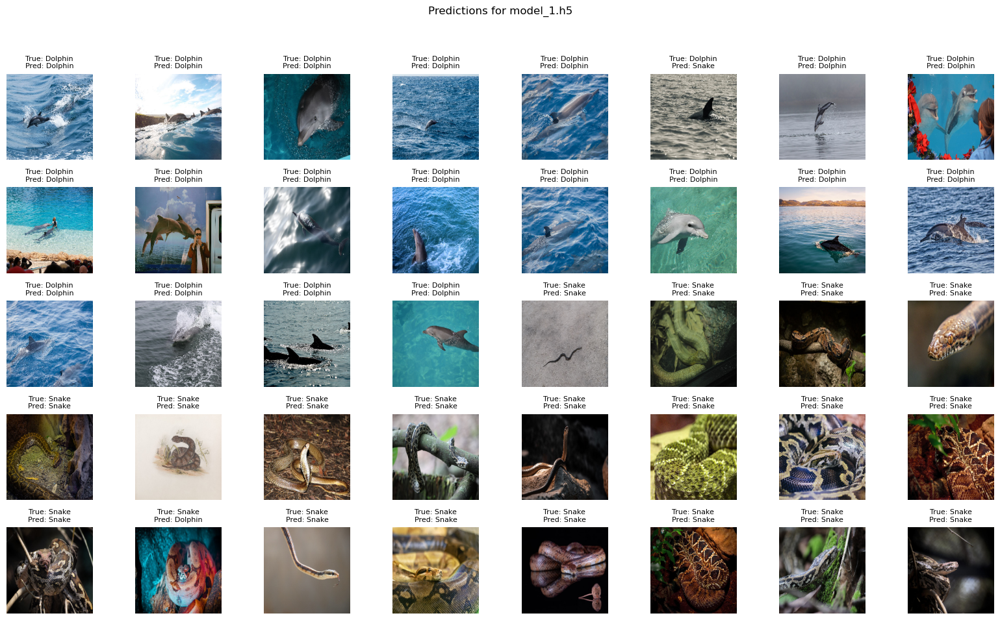

In [123]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def load_and_predict_single_model(model_path, test_dir,size):
    # Load the saved model
    model = tf.keras.models.load_model(model_path)
    print(f"Loaded model: {model_path}")
    
    # Create data generator for the test set
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    test_it = datagen.flow_from_directory(
        test_dir,
        class_mode='binary',
        batch_size=1,  # Set batch size to 1 for individual predictions
        target_size=(size, size),
        shuffle=False  # Keep images in order for consistent predictions
    )
    
    # Make predictions
    predictions = model.predict(test_it, steps=len(test_it), verbose=0)
    predicted_classes = (predictions > 0.5).astype(int).flatten()  # Assuming binary classification
    
    # Plot and display predictions
    plt.figure(figsize=(16, 10))
    for i in range(len(test_it.filenames)):
        plt.subplot(5, 8, i + 1)  # Adjust grid size if needed
        plt.imshow(test_it[i][0][0])  # Display the image
        
        # Get true and predicted labels
        true_label = 'Dolphin' if test_it[i][1][0] == 0 else 'Snake'
        pred_label = 'Dolphin' if predicted_classes[i] == 0 else 'Snake'
        
        # Set title with prediction result
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_1.h5"

# Directory containing test images
test_dir = 'dataset/test/'

# Run predictions for the model
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_2.h5
Found 40 images belonging to 2 classes.


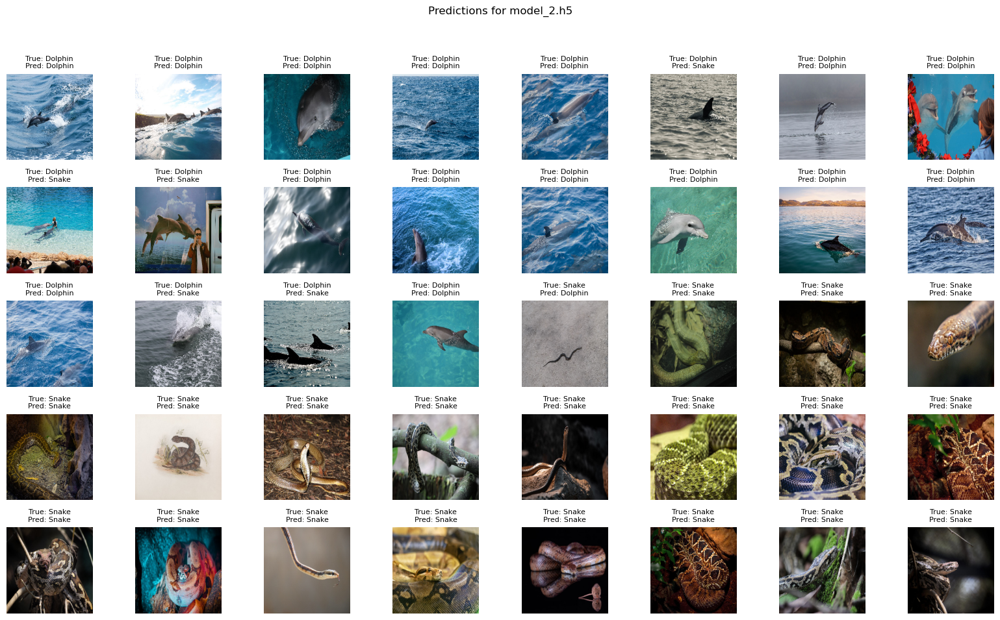

In [124]:
model_path = "model_2.h5"
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_3.h5
Found 40 images belonging to 2 classes.


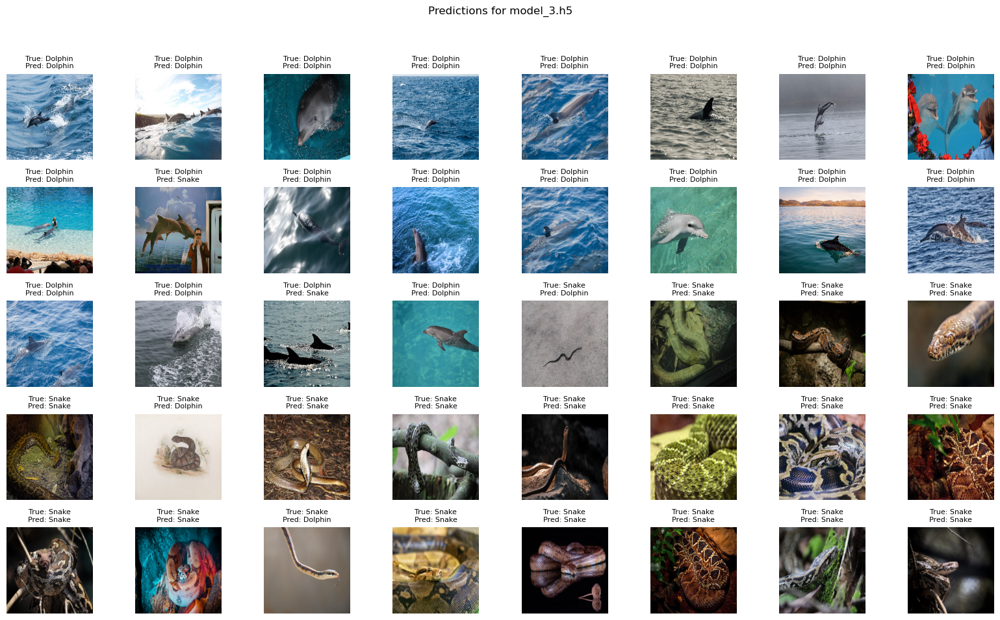

In [125]:
model_path = "model_3.h5"
load_and_predict_single_model(model_path, test_dir,200)


Loaded model: model_4.h5
Found 40 images belonging to 2 classes.


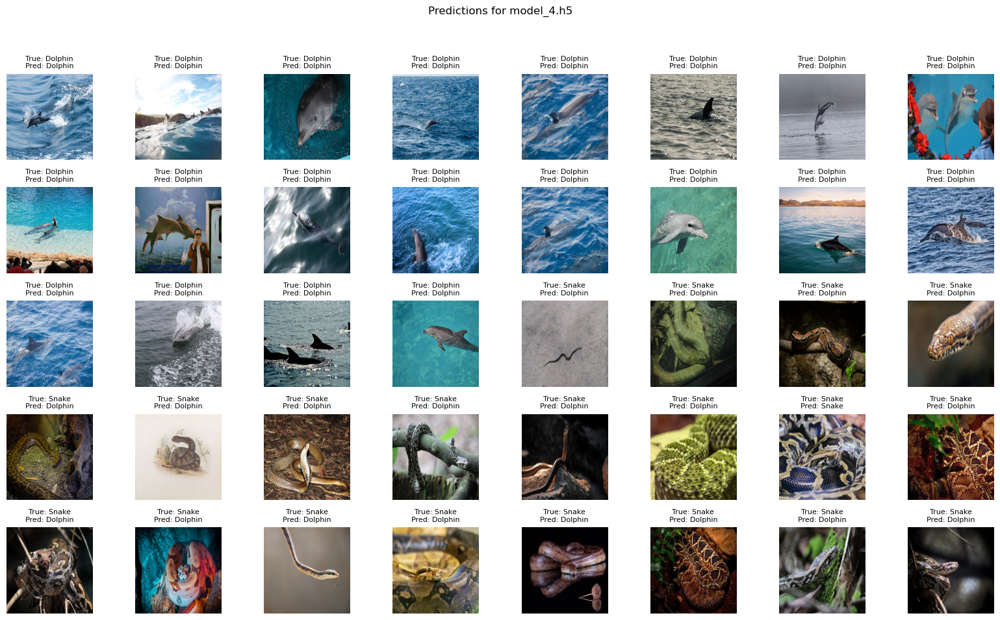

In [126]:
model_path = "model_4.h5"
load_and_predict_single_model(model_path, test_dir,224)


Loaded model: model_5.h5
Found 40 images belonging to 2 classes.


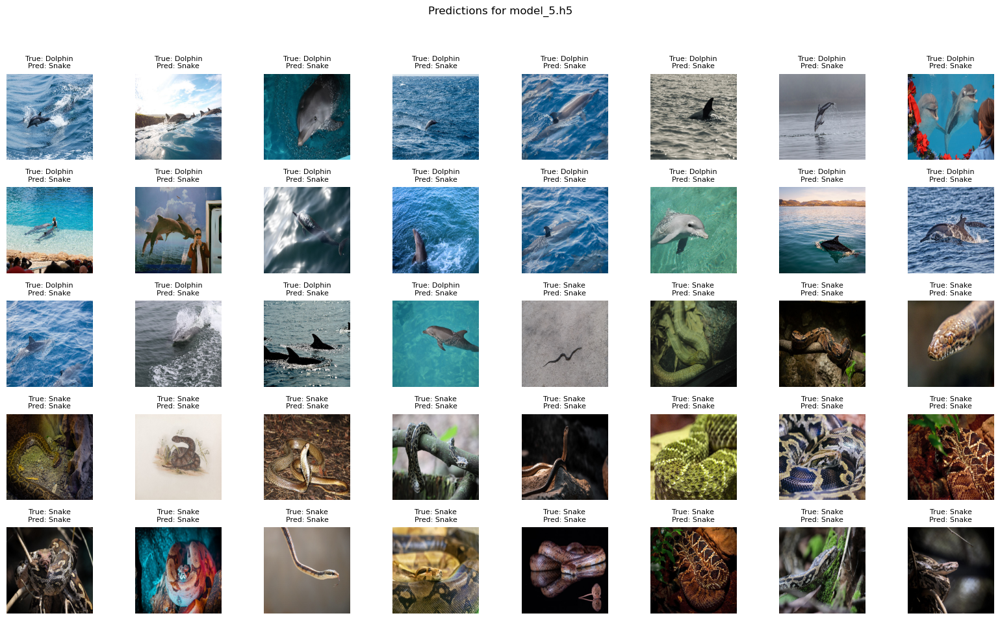

In [127]:
model_path = "model_5.h5"
load_and_predict_single_model(model_path, test_dir,224)


Are the results as expected? Why or why not?

For some of the models results were as expected and for some they were not, we thought VGG block 1 would have a lower accuracy than VGG block 3 due to less complex model but it outperformed it. VGG 16(with all layers tuned) was expected to be the best but it did not meet the prediction. Dolphins and snakes likely have distinct enough features that even a shallow model (1 block) can separate them fairly well. The pre-trained VGG16 model captures powerful features for general objects, and fine-tuning only the MLP layers allows the model to specialize in differentiating dolphins from snakes. This approach yields the best balance between accuracy and generalization without needing to re-learn all features, suggesting that VGG16’s pre-trained convolutional layers have sufficient feature diversity to capture the difference between these two classes.This suggests that for a dataset like dolphins vs. snakes, where the features are not overly complex, tuning all layers is excessive and likely disrupts useful pre-trained patterns.

Does data augmentation help? Why or why not?

Implementation of Data augmentation did not help the model as the training and testing accuraries were decreased because here we used flipping data augmentation where the orientation of images matters a lot as such the essential characeteristics(like curves) of the data is not easy to understand and combining these transformations effectively increases the dataset's complexity where the model might overfit to these variations rather than learning the actual differences between dolphins and snakes, reducing its ability to generalize to new data. For example when a snake's head is at right direction by flipping it would confuse it with the dolphin diving.

Does it matter how many epochs you fine-tune the model? Why or why not?

It doesn't matter for some models how many epochs we fine-tune the model with as the number of epochs keeps increasing after a certain point the model's decrement in loss is nearly zero. But for some models they struggle to capture the features in lower epochs leading to less impressive results. Also, increaing number of epochs may lead the model to overfit which captures all the nuances and noise in the data. Fine-tuning VGG1 for many epochs might quickly lead to overfitting, especially on complex tasks, as it lacks the depth to generalize well. With a few more layers, VGG3 has slightly better feature extraction capabilities than VGG1. It can benefit from more epochs than VGG1 but still risks overfitting with extended fine-tuning, as it's still relatively shallow. VGG16 model can generally benefit more from fine-tuning with more epochs, as it has the capacity to adapt deeply to the new task without quickly overfitting.

Are there any particular images that the model is confused about? Why or why not?

Yes there are some images when the image doesn't contain contain all the features of a particular animal(dolphin or snake) as both are almost have a semicircular shape or circular feautures misclassifications arise.

In [140]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np


In [141]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((200, 200)),  # Resize images to 200x200
    transforms.ToTensor(),          # Convert image to PyTorch tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Load datasets
train_dataset = datasets.ImageFolder(root='dataset/train', transform=transform)
test_dataset = datasets.ImageFolder(root='dataset/test', transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.Layer1 = nn.Linear(3 * 200 * 200, 128)
        self.Layer2 = nn.Linear(128, 64)
        self.Layer3 = nn.Linear(64, 32)
        self.Layer4 = nn.Linear(32, 16)
        self.Layer5 = nn.Linear(16, 2)  # Two outputs for binary classification

    def forward(self, x):
        x = x.view(-1, 3 * 200 * 200)  # Flatten the input
        x = F.leaky_relu(self.Layer1(x))
        x = F.leaky_relu(self.Layer2(x))
        x = F.leaky_relu(self.Layer3(x))
        x = F.leaky_relu(self.Layer4(x))
        x = self.Layer5(x)
        return F.log_softmax(x, dim=1)  # Log-softmax for binary classification


In [142]:
# Initialize model, loss, and optimizer
model = MLP()
criterion = nn.CrossEntropyLoss()  # Use CrossEntropy for log-softmax outputs
optimizer = optim.Adam(model.parameters(), lr=0.001)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


MLP(
  (Layer1): Linear(in_features=120000, out_features=128, bias=True)
  (Layer2): Linear(in_features=128, out_features=64, bias=True)
  (Layer3): Linear(in_features=64, out_features=32, bias=True)
  (Layer4): Linear(in_features=32, out_features=16, bias=True)
  (Layer5): Linear(in_features=16, out_features=2, bias=True)
)

In [143]:
import time

# Modified train function to calculate training accuracy
def train(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        
        # Calculate training accuracy
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)
    
    epoch_loss = running_loss / len(train_loader.dataset)
    accuracy = correct / total
    return epoch_loss, accuracy

# Evaluation function remains the same
def evaluate(model, test_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            
            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            
    epoch_loss = running_loss / len(test_loader.dataset)
    accuracy = correct / len(test_loader.dataset)
    return epoch_loss, accuracy

# Initialize accumulators for average metrics and total time
total_train_loss = 0.0
total_train_accuracy = 0.0
total_test_loss = 0.0
total_test_accuracy = 0.0
total_training_time = 0.0

# Set number of epochs
num_epochs = 10

# Train and evaluate
for epoch in range(num_epochs):
    start_time = time.time()  # Start timer
    
    # Training
    train_loss, train_accuracy = train(model, train_loader, criterion, optimizer, device)
    total_train_loss += train_loss
    total_train_accuracy += train_accuracy
    
    # Evaluation
    test_loss, test_accuracy = evaluate(model, test_loader, criterion, device)
    total_test_loss += test_loss
    total_test_accuracy += test_accuracy
    
    # End timer and calculate epoch duration
    epoch_time = time.time() - start_time
    total_training_time += epoch_time
    
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
          f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Time: {epoch_time:.2f}s')
    
    # Save the model at the last epoch
    if epoch == num_epochs - 1:
        model_filename = "model_mlp.h5"
        torch.save(model.state_dict(), model_filename)

# Calculate average metrics
avg_train_loss = total_train_loss / num_epochs
avg_train_accuracy = total_train_accuracy / num_epochs
avg_test_loss = total_test_loss / num_epochs
avg_test_accuracy = total_test_accuracy / num_epochs
training_time = total_training_time

# Print average metrics
print(f"\nAverage Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {(avg_train_accuracy)*100}")
print(f"Average Testing Loss: {avg_test_loss:.4f}")
print(f"Average Testing Accuracy: {avg_test_accuracy*100}")
print(f"Training Time: {training_time:.2f}s")


Epoch 1/10, Train Loss: 0.5819, Train Accuracy: 0.7000, Test Loss: 0.1755, Test Accuracy: 0.9000, Time: 4.01s
Epoch 2/10, Train Loss: 0.2261, Train Accuracy: 0.9375, Test Loss: 0.1998, Test Accuracy: 0.9500, Time: 3.65s
Epoch 3/10, Train Loss: 0.1400, Train Accuracy: 0.9750, Test Loss: 0.3524, Test Accuracy: 0.8500, Time: 3.66s
Epoch 4/10, Train Loss: 0.1010, Train Accuracy: 0.9750, Test Loss: 0.4159, Test Accuracy: 0.9500, Time: 3.67s
Epoch 5/10, Train Loss: 0.0931, Train Accuracy: 0.9812, Test Loss: 0.3239, Test Accuracy: 0.9000, Time: 6.30s
Epoch 6/10, Train Loss: 0.0457, Train Accuracy: 0.9875, Test Loss: 0.1817, Test Accuracy: 0.9500, Time: 10.21s
Epoch 7/10, Train Loss: 0.1466, Train Accuracy: 0.9688, Test Loss: 0.1741, Test Accuracy: 0.9250, Time: 10.24s
Epoch 8/10, Train Loss: 0.0523, Train Accuracy: 0.9875, Test Loss: 0.4814, Test Accuracy: 0.9250, Time: 10.12s
Epoch 9/10, Train Loss: 0.1150, Train Accuracy: 0.9625, Test Loss: 0.4474, Test Accuracy: 0.9250, Time: 10.45s
Epoch 

What can you conclude?

MLP model doesn't classify the images accurately as the input image in MLP model is flattened so the spatial features are reduced which results in poor classification of images whereas the convolutional neural networks captures all the spatial features finely which is more effective. MLP are not translation invariant hence the correlation between various positions of the image is not extracted by MLPs which are effectively extracted by CNNs due to use of filters.

Loaded model from: model_mlp.h5


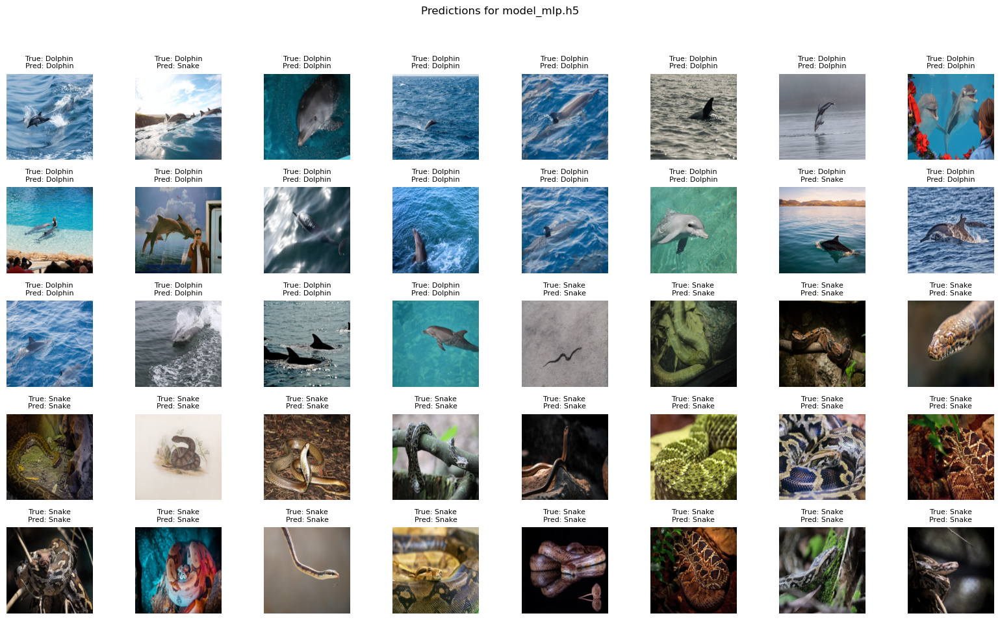

In [144]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
def load_and_predict_pytorch_model(model_path, test_dir, size=200):
    # Load the saved model
    model = MLP()
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set to evaluation mode
    print(f"Loaded model from: {model_path}")
    
    # Load test dataset
    test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
    
    # Prepare for prediction display
    plt.figure(figsize=(16, 10))
    
    # Loop through the test dataset
    for i, (images, labels) in enumerate(test_loader):
        # Predict using the model
        with torch.no_grad():
            output = model(images)
            pred_class = output.argmax(dim=1).item()  # Get the predicted class (0 or 1)
        
        # Display the image
        img_np = images[0].numpy().transpose((1, 2, 0))  # Change from (C, H, W) to (H, W, C)
        img_np = np.clip((img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406], 0, 1)
        plt.subplot(5, 8, i + 1)  # Adjust grid size if needed
        plt.imshow(img_np)
        
        # Determine the true and predicted labels
        true_label = 'Dolphin' if labels.item() == 0 else 'Snake'
        pred_label = 'Dolphin' if pred_class == 0 else 'Snake'
        
        # Set title with prediction result
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_mlp.h5"  # Ensure this path and file format match your saved model

# Directory containing test images
test_dir = 'dataset/test/'  # Use the correct test directory path

# Run pr  edictions for the model
load_and_predict_pytorch_model(model_path, test_dir)


Loaded model: model_1.h5


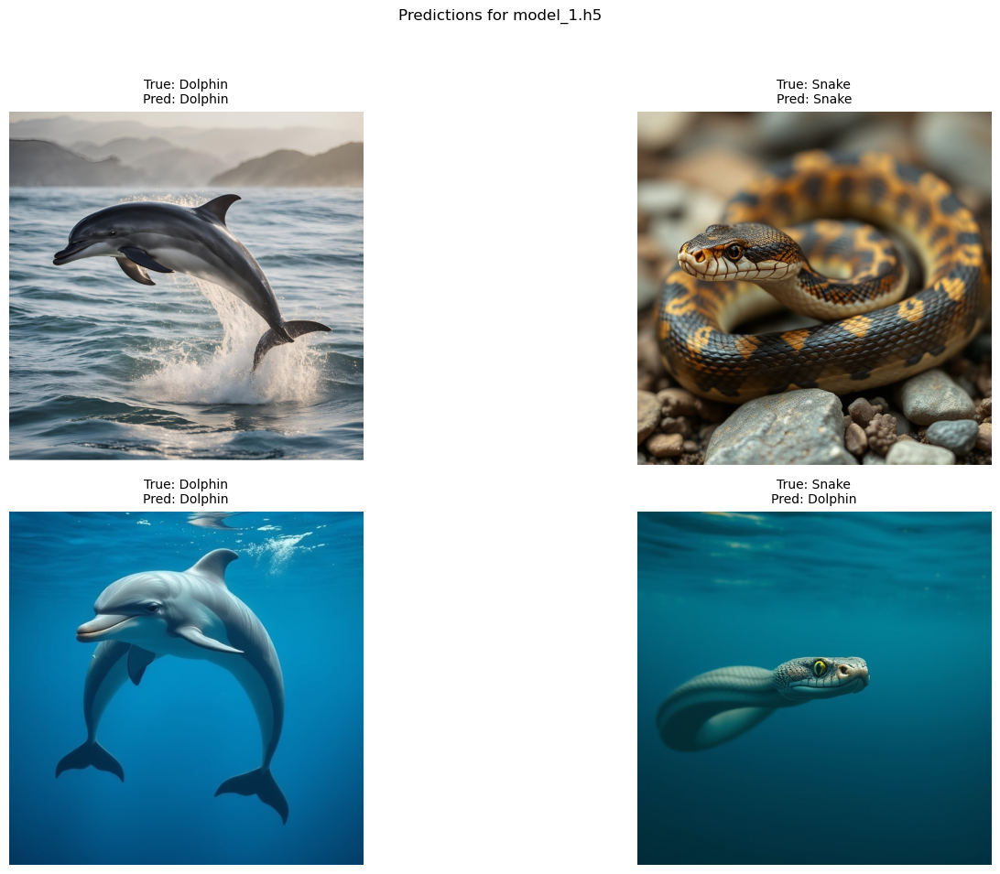

In [145]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def load_and_predict_single_model(model_path, test_dir, size):
    # Load the saved model
    model = tf.keras.models.load_model(model_path)
    print(f"Loaded model: {model_path}")
    
    # Get list of images in the test_dir
    image_names = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Create an ImageDataGenerator instance for preprocessing the images
    datagen = ImageDataGenerator(rescale=1.0/255.0)
    
    # Prepare images and make predictions
    images = []
    for image_name in image_names:
        img_path = os.path.join(test_dir, image_name)
        img = image.load_img(img_path, target_size=(size, size))  # Load and resize image
        img_array = image.img_to_array(img)  # Convert to numpy array
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = datagen.standardize(img_array)  # Apply rescaling
        
        images.append(img_array)
    
    # Stack all the images into a single array
    images = np.vstack(images)
    
    # Make predictions
    predictions = model.predict(images, verbose=0)
    predicted_classes = (predictions > 0.5).astype(int).flatten()  # Assuming binary classification
    
    # Plot and display predictions
    plt.figure(figsize=(16, 10))
    for i, image_name in enumerate(image_names):
        plt.subplot(2, 2, i + 1)  # Adjust grid size if needed
        img = image.load_img(os.path.join(test_dir, image_name))  # Reload original image
        plt.imshow(img)
        
        # Set title with prediction result
        true_label = 'Dolphin' if image_name.startswith('easy_dolphin') or image_name.startswith('hard_dolphin') else 'Snake'
        pred_label = 'Dolphin' if predicted_classes[i] == 0 else 'Snake'
        
        # Display labels
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=10)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_1.h5"

# Directory containing test images
test_dir = 'image_tool'

# Run predictions for the model
load_and_predict_single_model(model_path, test_dir, 200)


Loaded model: model_2.h5


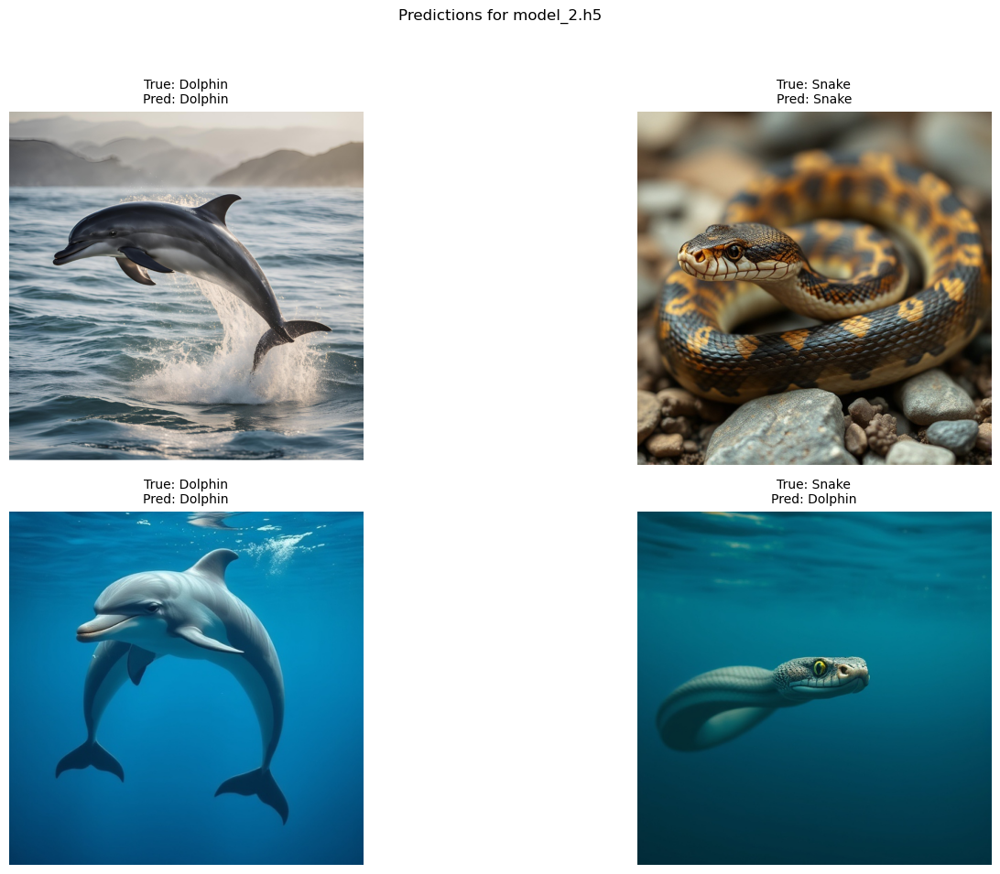

In [146]:
model_path = "model_2.h5"
load_and_predict_single_model(model_path, test_dir, 200)

Loaded model: model_3.h5


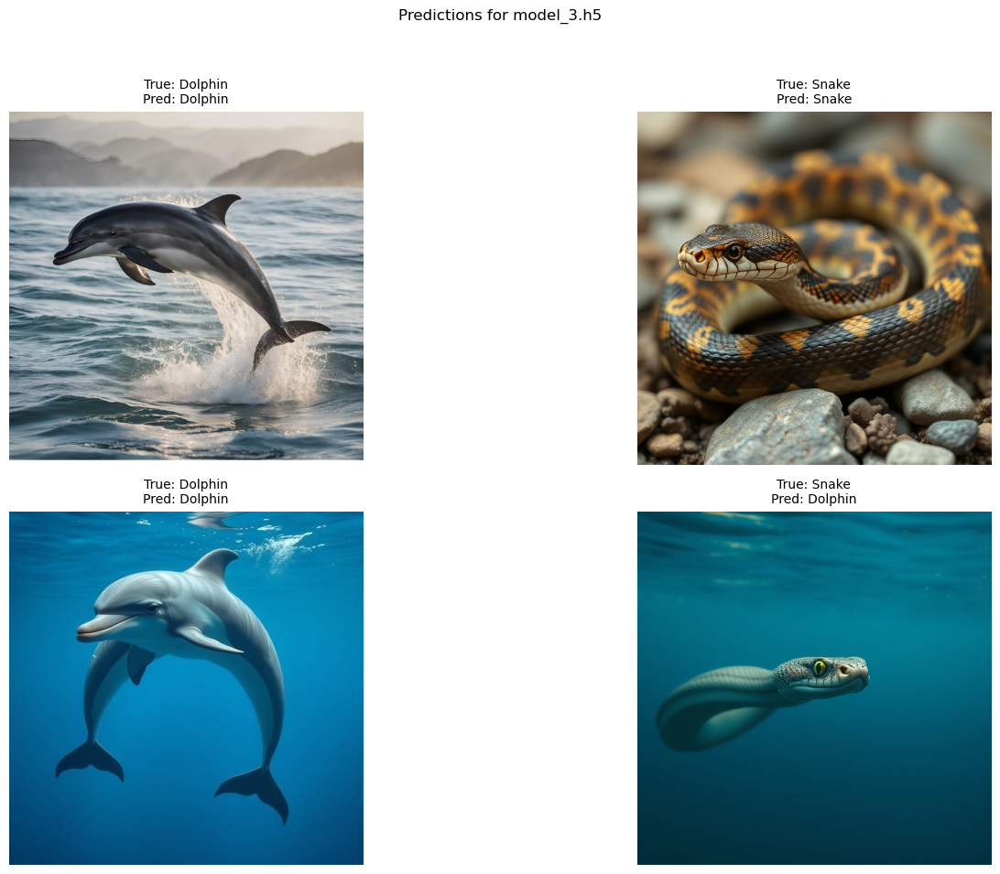

In [147]:
model_path = "model_3.h5"
load_and_predict_single_model(model_path, test_dir, 200)

Loaded model: model_4.h5


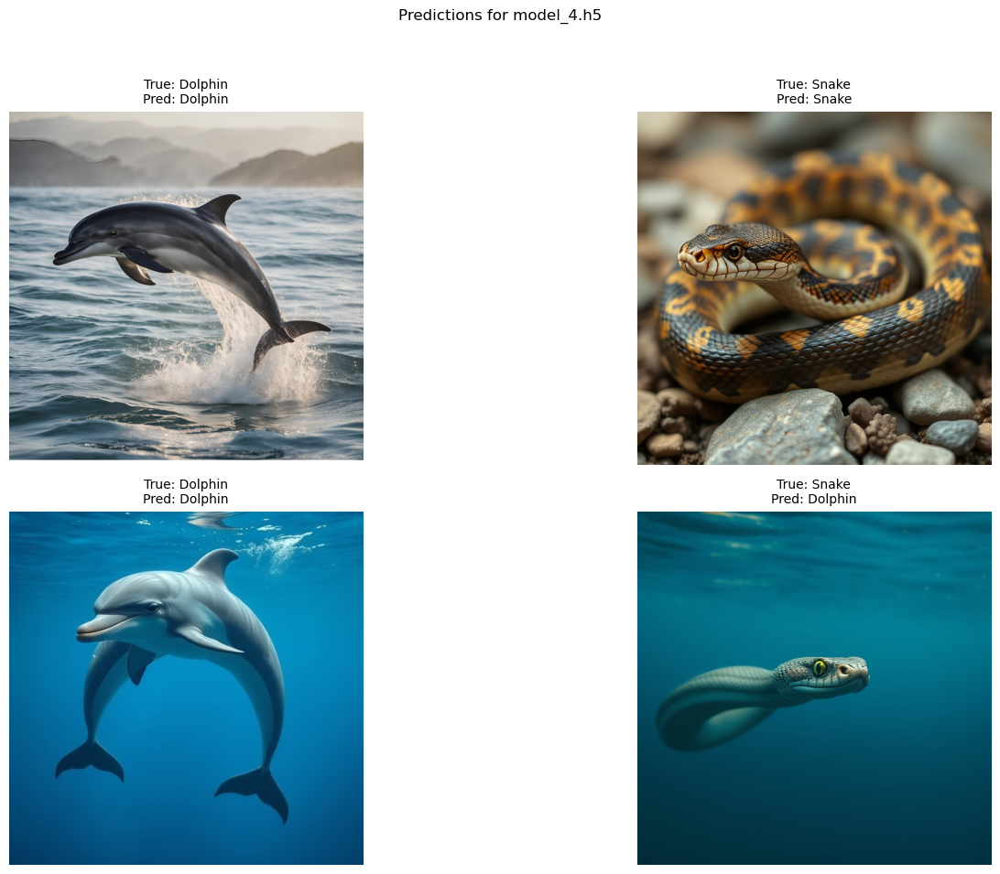

In [148]:
model_path = "model_4.h5"
load_and_predict_single_model(model_path, test_dir, 224)

Loaded model: model_5.h5


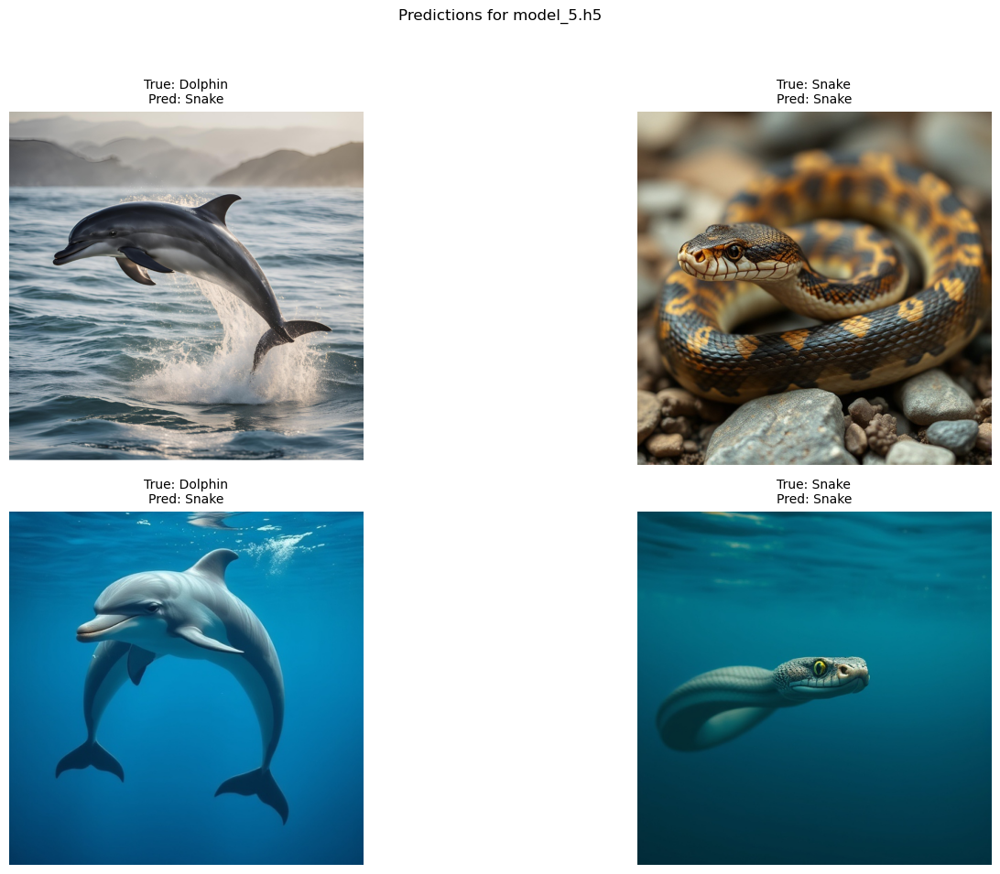

In [149]:
model_path = "model_5.h5"
load_and_predict_single_model(model_path, test_dir, 224)

Loaded model from: model_mlp.h5


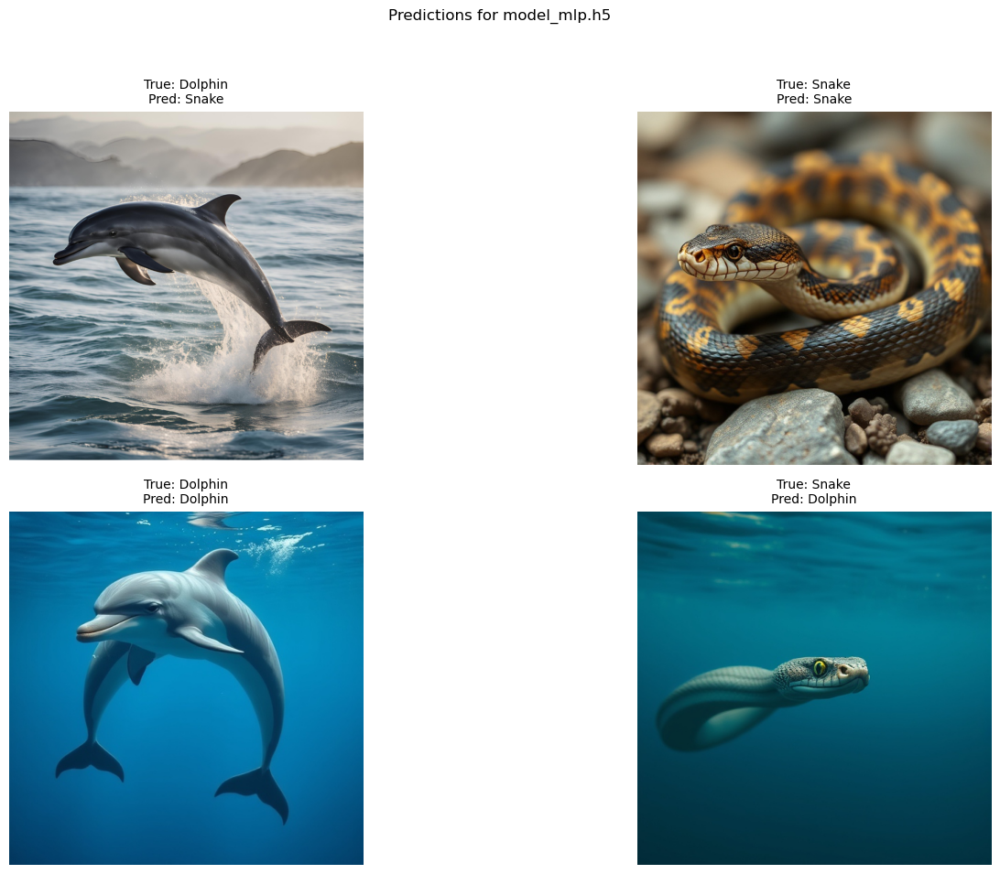

In [150]:
from PIL import Image
def load_and_predict_pytorch_model(model_path, test_dir):
    # Load the saved model
    model = MLP()
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set to evaluation mode
    print(f"Loaded model from: {model_path}")

    # List of image files in the test directory
    image_names = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    images, predictions = [], []

    # Prepare and predict each image
    for image_name in image_names:
        img_path = os.path.join(test_dir, image_name)
        
        # Load image and apply transformations
        img = Image.open(img_path).convert("RGB")
        img_transformed = transform(img).unsqueeze(0)  # Add batch dimension

        # Predict using the model
        with torch.no_grad():
            output = model(img_transformed)
            pred_class = output.argmax(dim=1).item()  # Get the predicted class (0 or 1)

        # Store results for displaying
        images.append(img)
        predictions.append(pred_class)

    # Display predictions
    plt.figure(figsize=(16, 10))
    for i, (img, pred_class) in enumerate(zip(images, predictions)):
        plt.subplot(2, 2, i + 1)  # Adjust grid size if needed
        plt.imshow(img)
        
        # Set title with prediction result
        true_label = 'Dolphin' if image_names[i].startswith('easy_dolphin') or image_names[i].startswith('hard_dolphin') else 'Snake'
        pred_label = 'Dolphin' if pred_class == 0 else 'Snake'
        
        # Display labels
        plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=10)
        plt.axis('off')
    
    plt.suptitle(f"Predictions for {model_path}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
    plt.show()

# Path to the saved model
model_path = "model_mlp.h5"  # Make sure this is the correct path and format for PyTorch

# Directory containing test images
test_dir = 'image_tool'

# Run predictions for the model
load_and_predict_pytorch_model(model_path, test_dir)